In [76]:
import numpy as np
from pyproj import Transformer
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
%matplotlib inline

In [77]:
# some random hotspot coordinates
hs1_lla = np.array([[44.304234, -96.780698, 0], [50.715620, -1.883604, 0]])
hs2_lla = np.array([[44.320588, -96.912926, 0], [50.725903, -1.865836, 0]])
hs3_lla = np.array([[44.293880, -96.812899, 0], [50.721518, -1.874929, 0]])

# Convert to cartesian coordinates (assume altitude of 1)
trans_GPS_to_XYZ = Transformer.from_crs("EPSG:4326", "EPSG:4978", always_xy=True)
hs1_xyz_m = np.stack(list(trans_GPS_to_XYZ.transform(hs1_lla[:,1], hs1_lla[:,0], hs1_lla[:,2])), axis=1)
hs2_xyz_m = np.stack(list(trans_GPS_to_XYZ.transform(hs2_lla[:,1], hs2_lla[:,0], hs2_lla[:,2])), axis=1)
hs3_xyz_m = np.stack(list(trans_GPS_to_XYZ.transform(hs3_lla[:,1], hs3_lla[:,0], hs3_lla[:,2])), axis=1)

In [78]:
# Calculate the centroids for each sample
#   centroid = the center of mass on the surface of the earth between the 3 hotspots
#   For relatively small distances (nearby points on a sphere), a projection of the cartesian centroid is probably fine

# first calculate the cartesian centroid (this will be INSIDE the sphere)
cartesian_centroid_xyz_m = (hs1_xyz_m + hs2_xyz_m + hs3_xyz_m) / 3
# convert to lat/long - will have a negative altitude
centroid_long, centroid_lat, centroid_alt = trans_GPS_to_XYZ.transform(
    cartesian_centroid_xyz_m[:,0], 
    cartesian_centroid_xyz_m[:,1],
    cartesian_centroid_xyz_m[:,2], 
    direction="INVERSE"
)
# Project back out to the surface of the sphere by again calculating x,y,z from the same lat/long but with ZERO altitude (ie: on the surface)
projected_centroid_xyz_m = np.stack(list(trans_GPS_to_XYZ.transform(centroid_long, centroid_lat, np.zeros_like(centroid_lat))), axis=1)

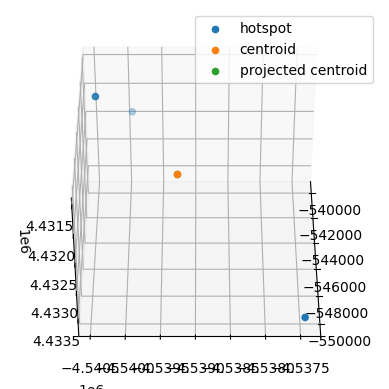

In [79]:
# plot an example
sample_idx = 0
fig = plt.figure()
ax = fig.add_subplot(1, 1, 1, projection='3d')
all_hs_xyz_m = np.stack([hs1_xyz_m[sample_idx], hs2_xyz_m[sample_idx], hs3_xyz_m[sample_idx]])
ax.scatter(all_hs_xyz_m[:,0], all_hs_xyz_m[:,1], all_hs_xyz_m[:,2], label="hotspot")
ax.scatter(cartesian_centroid_xyz_m[sample_idx, 0], cartesian_centroid_xyz_m[sample_idx, 1], cartesian_centroid_xyz_m[sample_idx, 2], label="centroid")
ax.scatter(projected_centroid_xyz_m[sample_idx, 0], projected_centroid_xyz_m[sample_idx, 1], projected_centroid_xyz_m[sample_idx, 2], label="projected centroid")
plt.legend()
def animate(frame):
    ax.view_init(-140, frame)
ani = FuncAnimation(fig, animate, frames=100, interval=30)
HTML(ani.to_jshtml())